In [1]:
import os 
import re
import glob
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt

from kinetic_function import (fit_function,
                              read_csv_file, 
                              read_csv_file_v2,
                              single_track_analysis,
                              autocorrelation,
                              fit_autocorrelation,
                              fit_autocorrelation_v2,
                              check_continuous_time,
                              calculate_MSD,
                             )

In [2]:
%pdb

Automatic pdb calling has been turned ON


In [3]:
PROTEIN_SIZE = 1200
DELTA_T = 0.97
delta_t_dir = {"4":3.97, "1":0.97, "0.7":0.7, "0.4":0.4, "0.3":0.3, "0.2":0.2}

In [28]:
directory = "/mnt/sda1/Sophie/2-KineticAnalysisData/2-Datas/03-Dropbox/tracking Sna 1sec & 4 sec frame interval/"
paths = os.listdir(directory)
paths



['frame interval 0.7ms (exp502)',
 'frame interval 0.4ms (exp504)',
 'frame interval 0.3ms (exp508)',
 'frame interval 0.2ms (exp507)',
 'frame interval 1 sec feuille 100x1400',
 'frame interval 1 sec feuille 100x1400 MIP',
 'frame interval 4 sec feuille 15x550',
 'frame interval 4sec feuille 100x1400 MIP']

# Single track analysis

In [197]:
list_csv = glob.glob(directory+paths[5]+"/*.csv")

for csv in list_csv:
    if re.search("^(?!.*result).*$", csv,):
        print(csv)

        datas = read_csv_file_v2(csv, sep=",")
        datas.groupby('TRACK ID').max()['FRAME'] - datas.groupby('TRACK ID').min()['FRAME']
        

/mnt/sda1/Sophie/2-KineticAnalysisData/2-Datas/03-Dropbox/tracking Sna 1sec & 4 sec frame interval/frame interval 1 sec feuille 100x1400 MIP/tracks LLS sinc100x1400,Exp50ms488 30%, 200 frames interval 1sec, 5stack_MIP.csv


In [198]:
DELTA_T = 0.0002
DELTA_T = 0.97

In [199]:
datas.rename({"TRACK ID":"TRACK_ID",
             "T":"POSITION_T",
             "MEAN INTENSITY CH1":"MEAN_INTENSITY_CH1"}, 
             axis=1, 
             inplace=True)
datas


,index,LABEL,SPOT ID,TRACK_ID,QUALITY,X,Y,Z,POSITION_T,FRAME,RADIUS,VISIBILITY,MEAN_INTENSITY_CH1,MEDIAN INTENSITY CH1,MIN INTENSITY CH1,MAX INTENSITY CH1,SUM INTENSITY CH1,STD INTENSITY CH1,CONTRAST CH1,SIGNAL/NOISE RATIO CH1
3,6,ID887817,887817,5,589.580810546875,101.340298,132.156298,0.0,166.0,166,0.31134968286143994,1,1894.619048,1773.0,1328.0,2756.0,39787.0,398.6021169274539,0.25983603718601417,1.9606390627740136
4,7,ID848905,848905,5,541.6452026367188,102.279065,131.910153,0.0,3.0,3,0.31134968286143994,1,2085.142857,2025.0,1180.0,3248.0,43788.0,607.8605338162929,0.20055828921540492,1.1460913346394943
5,8,ID892677,892677,5,432.4263610839844,100.899362,131.839576,0.0,190.0,190,0.31134968286143994,1,1245.333333,1145.0,700.0,2336.0,26152.0,409.7597263437847,0.2807541914403556,1.3324373567367016
6,9,ID872967,872967,5,891.2266235351562,101.370459,131.525913,0.0,99.0,99,0.31134968286143994,1,2233.857143,2295.0,1181.0,3565.0,46911.0,700.7349916847513,0.31400025734640835,1.5235830789948384
7,10,ID881159,881159,5,372.8922424316406,101.395644,132.553425,0.0,139.0,139,0.31134968286143994,1,1246.190476,1089.0,602.0,1865.0,26170.0,447.65875609079944,0.19015236462912197,0.8895420989889888
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16930,16933,ID891902,891902,979,171.61964416503906,76.499784,118.002806,0.0,185.0,185,0.31134968286143994,1,1114.952381,1099.0,718.0,1508.0,23414.0,182.26093278332473,0.10892589676342261,1.2017699621130995
16931,16934,ID886395,886395,979,298.5574035644531,77.058196,118.181542,0.0,161.0,161,0.31134968286143994,1,1445.952381,1428.0,1049.0,1936.0,30365.0,276.7366033235351,0.11679269202345122,1.0928498217688696
16932,16935,ID880113,880113,979,291.198974609375,77.195905,117.785307,0.0,132.0,132,0.31134968286143994,1,1451.714286,1461.0,938.0,1911.0,30486.0,275.2777039386123,0.14560705717395978,1.3405618414943614
16933,16936,ID885105,885105,979,188.86404418945312,77.088795,118.032640,0.0,154.0,154,0.31134968286143994,1,1220.619048,1244.0,920.0,1543.0,25633.0,193.83304057628467,0.08895007527341377,1.0287756601910938


In [200]:
print(np.unique(datas["TRACK_ID"]))
datas.head()

[  5   9  10  12  13  15  17  18  21  23  24  31  32  35  36  37  41  43
  45  47  57  61  68  76  78  95  97 107 119 124 126 132 134 135 146 157
 162 164 165 166 169 170 173 174 178 180 184 187 189 193 201 209 212 220
 222 223 226 228 231 234 239 243 244 248 249 252 255 256 273 280 281 282
 288 289 319 320 321 330 332 334 341 344 348 352 353 362 368 372 373 379
 390 391 410 415 418 452 454 455 458 470 492 493 505 521 523 524 529 536
 558 584 586 598 602 627 644 648 651 656 674 678 683 687 728 749 750 755
 758 759 761 762 769 773 787 797 798 809 825 828 849 853 857 860 870 877
 879 880 883 884 891 901 907 914 916 921 922 924 926 928 929 942 967 972
 979]


,index,LABEL,SPOT ID,TRACK_ID,QUALITY,X,Y,Z,POSITION_T,FRAME,RADIUS,VISIBILITY,MEAN_INTENSITY_CH1,MEDIAN INTENSITY CH1,MIN INTENSITY CH1,MAX INTENSITY CH1,SUM INTENSITY CH1,STD INTENSITY CH1,CONTRAST CH1,SIGNAL/NOISE RATIO CH1
3,6,ID887817,887817,5,589.580810546875,101.340298,132.156298,0.0,166.0,166,0.31134968286143994,1,1894.619048,1773.0,1328.0,2756.0,39787.0,398.6021169274539,0.25983603718601417,1.9606390627740136
4,7,ID848905,848905,5,541.6452026367188,102.279065,131.910153,0.0,3.0,3,0.31134968286143994,1,2085.142857,2025.0,1180.0,3248.0,43788.0,607.8605338162929,0.20055828921540492,1.1460913346394943
5,8,ID892677,892677,5,432.4263610839844,100.899362,131.839576,0.0,190.0,190,0.31134968286143994,1,1245.333333,1145.0,700.0,2336.0,26152.0,409.7597263437847,0.2807541914403556,1.3324373567367016
6,9,ID872967,872967,5,891.2266235351562,101.370459,131.525913,0.0,99.0,99,0.31134968286143994,1,2233.857143,2295.0,1181.0,3565.0,46911.0,700.7349916847513,0.31400025734640835,1.5235830789948384
7,10,ID881159,881159,5,372.8922424316406,101.395644,132.553425,0.0,139.0,139,0.31134968286143994,1,1246.190476,1089.0,602.0,1865.0,26170.0,447.65875609079944,0.19015236462912197,0.8895420989889888


In [201]:
DELTA_T = 0.97


id_track = 23
(x, 
 y, 
 x_auto, 
 y_auto, 
 elongation_r, 
 translation_init_r,
 perr) = single_track_analysis(datas, 
                                 id_track, 
                                 delta_t = DELTA_T,
                                 protein_size=PROTEIN_SIZE,
                                 normalise_intensity=1,
                                 normalize_auto=True,
                                 mm=None,
                                 lowpass_=False,
                                 cutoff=100,
                                 rtol=1e-5,
                                 method="original",
                                force_analysis=True,
                                  first_dot=True)
# (x, 
#  y_cutoff, 
#  x_auto, 
#  y_auto, 
#  elongation_r, 
#  translation_init_r) = single_track_analysis(datas, 
#                                              id_track, 
#                                              delta_t = DELTA_T,
#                                              protein_size=PROTEIN_SIZE,
#                                              normalise_intensity=1,
#                                              normalize=True,
#                                              lowpass_=True,
#                                              cutoff=100,)
print(elongation_r, translation_init_r)
print(perr)

not fix
force analysis
original method
103.4029905030866 2.5095786696392555
[2.16831284 0.44606105]


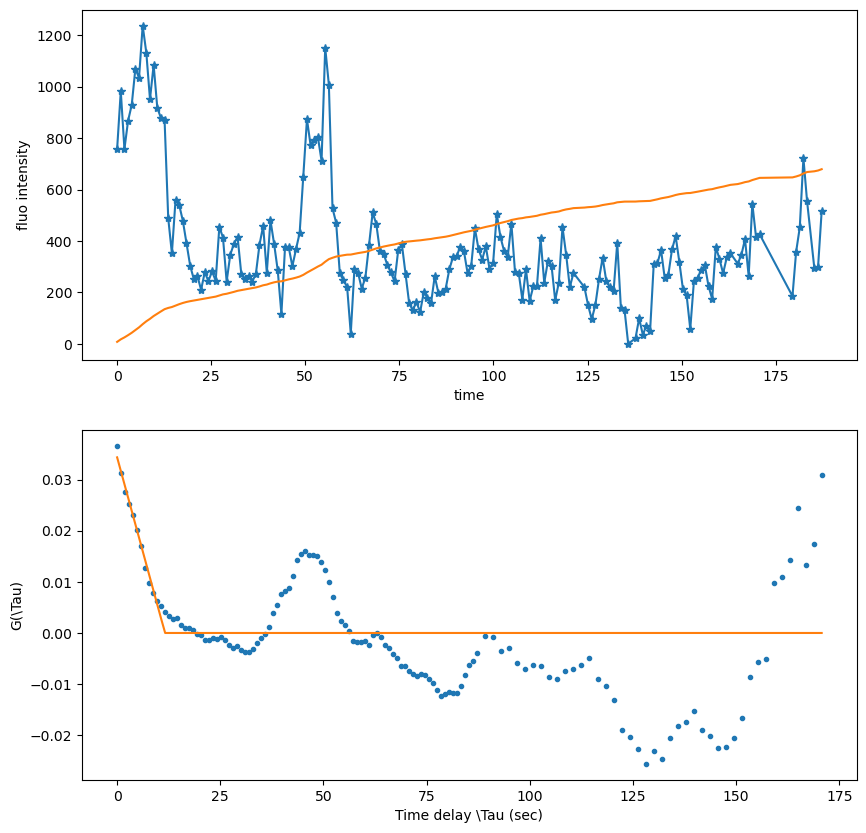

In [202]:
fig, ax = plt.subplots(2,1)

ax[0].plot(x, y-np.min(y), "*-")
# ax[0].plot(x,y_cutoff)
ax[0].set_xlabel("time")
ax[0].set_ylabel("fluo intensity")

ax[0].plot(x, (y-np.min(y)).cumsum(axis=0)/100)


ax[1].plot(x_auto, y_auto, '.')
ax[1].plot(x_auto, fit_function(x_auto, PROTEIN_SIZE/elongation_r, translation_init_r) )
ax[1].set_xlabel("Time delay \Tau (sec)")
ax[1].set_ylabel("G(\Tau)")
fig.set_size_inches((10,10))

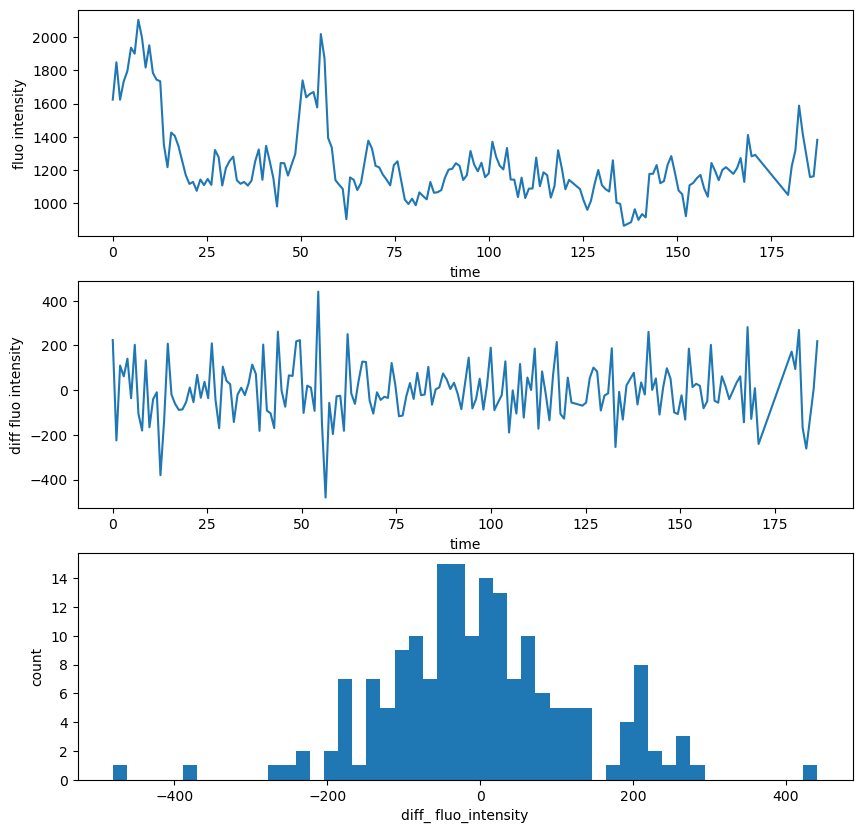

In [203]:
## difference between 2 time points
fig, ax = plt.subplots(3,1)
ax[0].plot(x,y)
ax[0].set_xlabel("time")
ax[0].set_ylabel("fluo intensity")

ax[1].plot(x[:-1], np.diff(y))
ax[1].set_xlabel("time")
ax[1].set_ylabel("diff fluo intensity")
_=ax[2].hist(np.diff(y), bins=50)
ax[2].set_ylabel("count")
ax[2].set_xlabel("diff_ fluo_intensity")
fig.set_size_inches((10,10))

Text(0, 0.5, 'intensity')

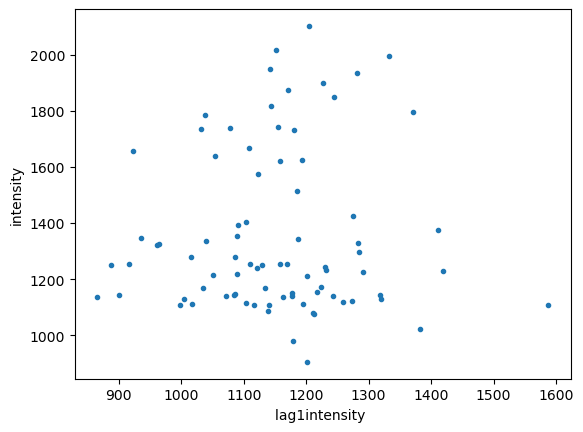

In [204]:
fig, ax = plt.subplots()
lag = 100
ax.plot(y[lag:], y[:-lag], '.')
ax.set_xlabel("lag1intensity ")
ax.set_ylabel("intensity")

In [206]:
DELTA_T

0.97

not fix
force analysis
original method
not fix
not fix
force analysis
original method
not fix
to fix
original method
to fix
not fix
force analysis
original method
not fix
not fix
force analysis
original method
not fix
not fix
force analysis
original method
not fix
to fix
original method
to fix
not fix
force analysis
original method
not fix
not fix
force analysis
original method
not fix
not fix
force analysis
original method
not fix
not fix
force analysis
original method
not fix
not fix
force analysis
original method
not fix
not fix
force analysis
original method
not fix
not fix
force analysis
original method
not fix
not fix
force analysis
original method
not fix
not fix
force analysis
original method
not fix
not fix
force analysis
original method
not fix
not fix
force analysis
original method
not fix
not fix
force analysis
original method
not fix
not fix
force analysis
original method
not fix
not fix
force analysis
original method
not fix


/tmp/ipykernel_26434/3053148827.py:43: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(2,1)


to fix
original method
to fix
to fix
original method
to fix
not fix
force analysis
original method
not fix
to fix
original method
not fix
not fix
force analysis
original method
not fix
not fix
force analysis
original method
not fix
not fix
force analysis
original method
not fix
not fix
force analysis
original method
not fix
not fix
force analysis
original method
not fix
not fix
force analysis
original method
not fix
not fix
force analysis
original method
not fix
not fix
force analysis
original method
not fix
not fix
force analysis
original method
not fix
not fix
force analysis
original method
not fix
not fix
force analysis
original method
not fix
not fix
force analysis
original method
not fix
not fix
force analysis
original method
not fix
not fix
force analysis
original method
not fix
not fix
force analysis
original method
not fix
not fix
force analysis
original method
not fix
not fix
force analysis
original method
not fix
not fix
force analysis
original method
not fix
not fix
force an

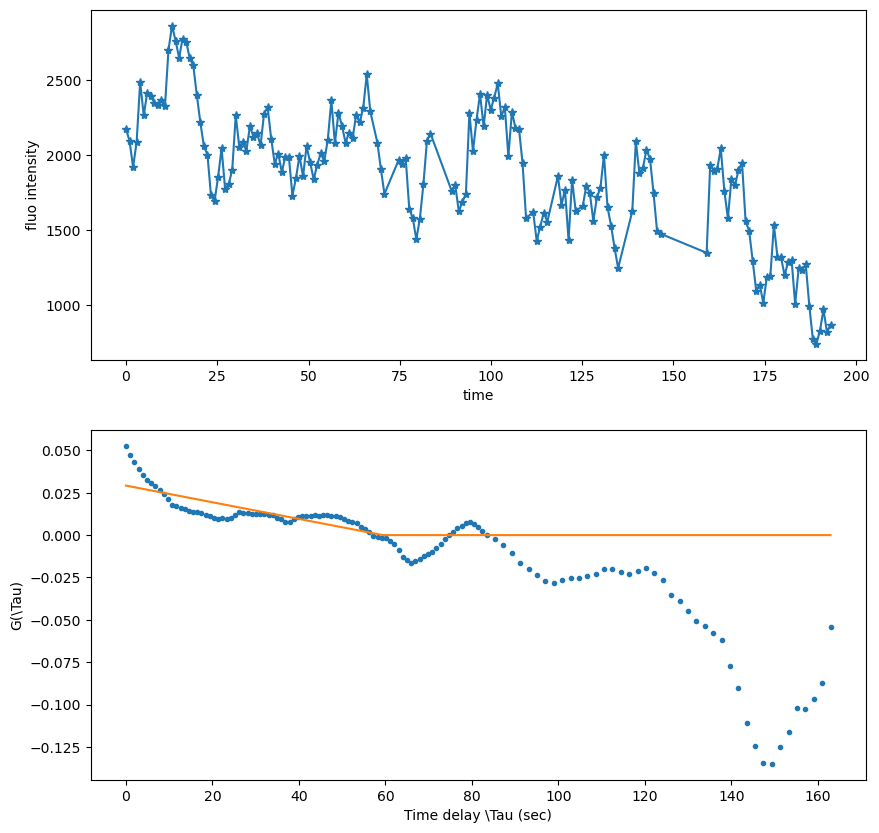

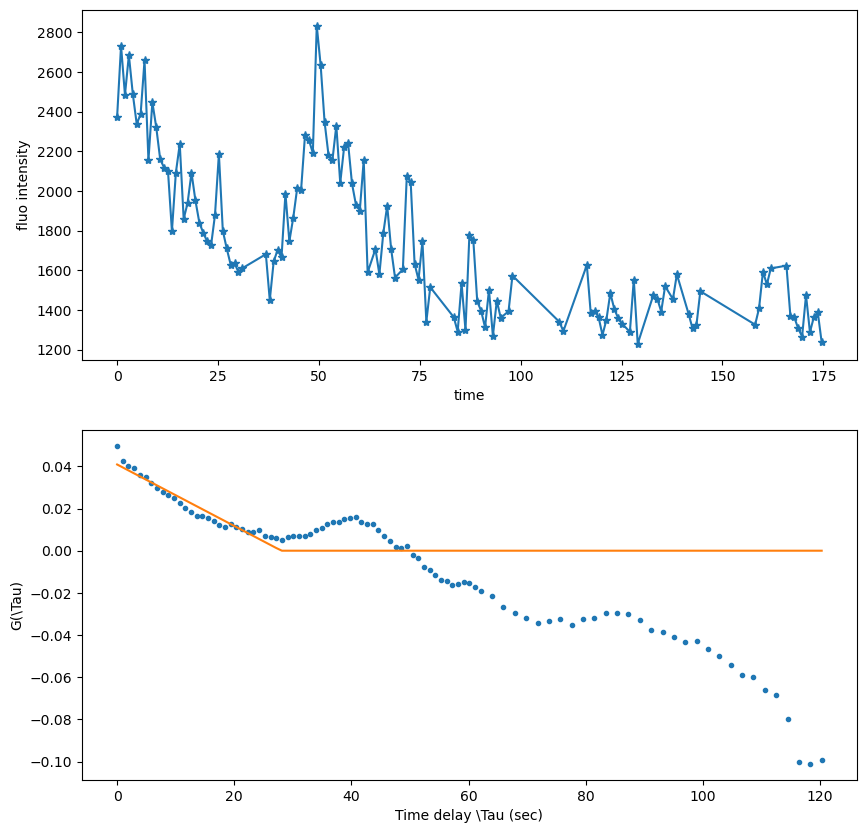

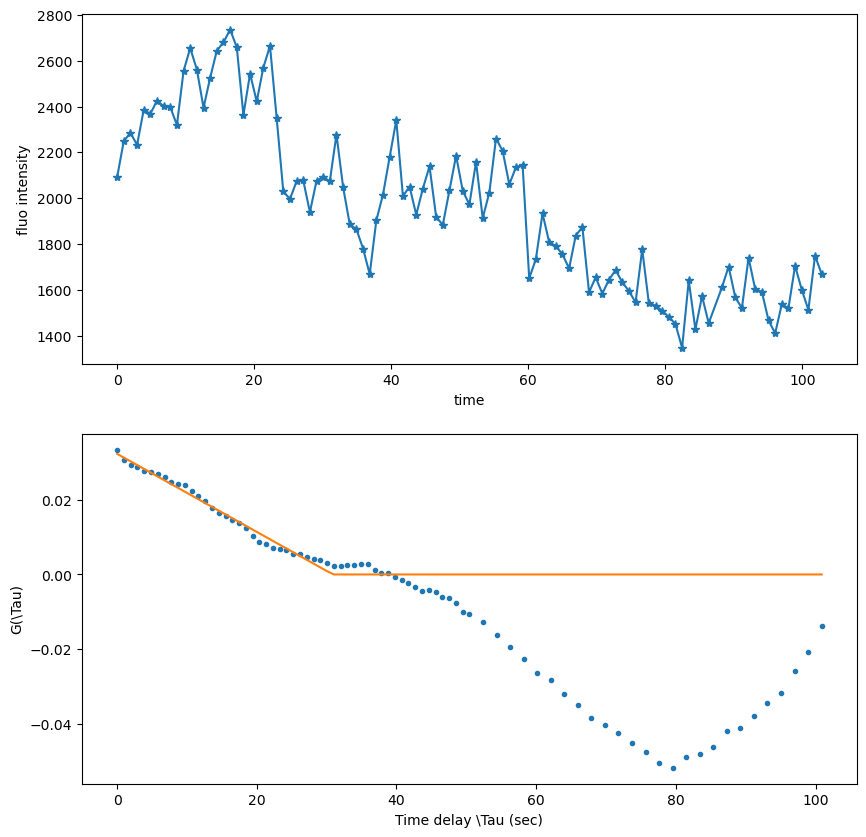

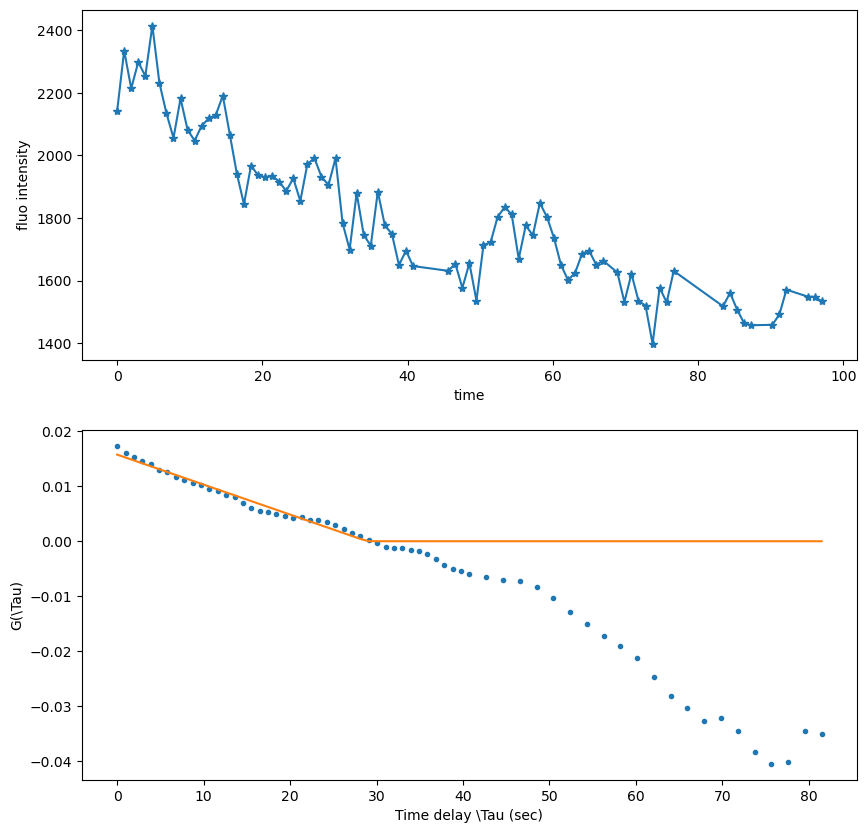

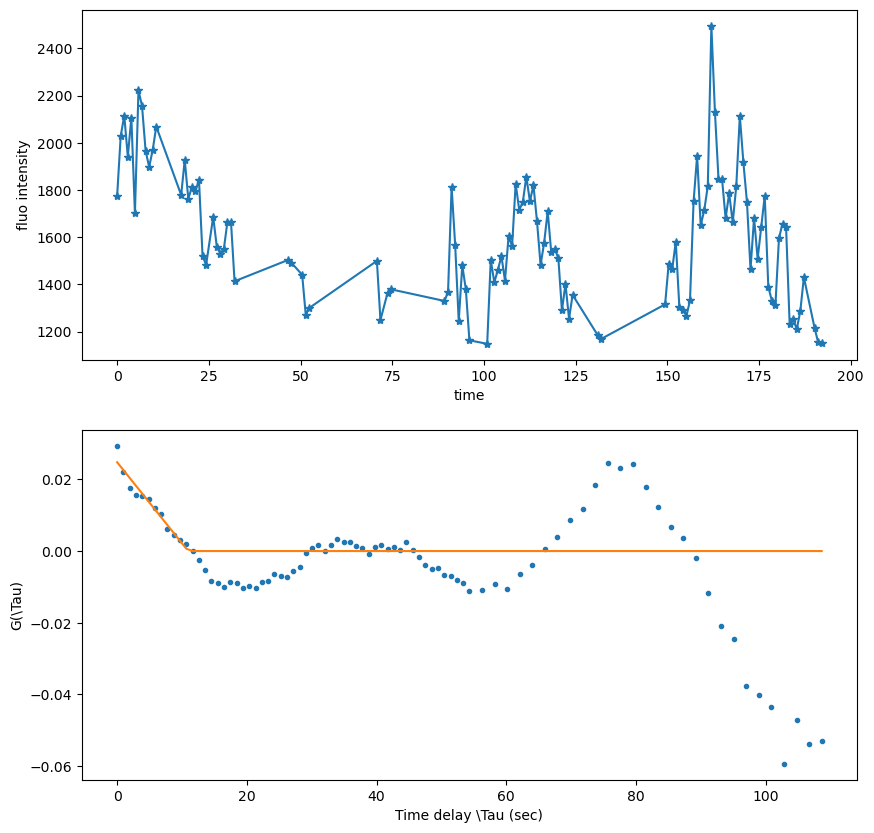

...

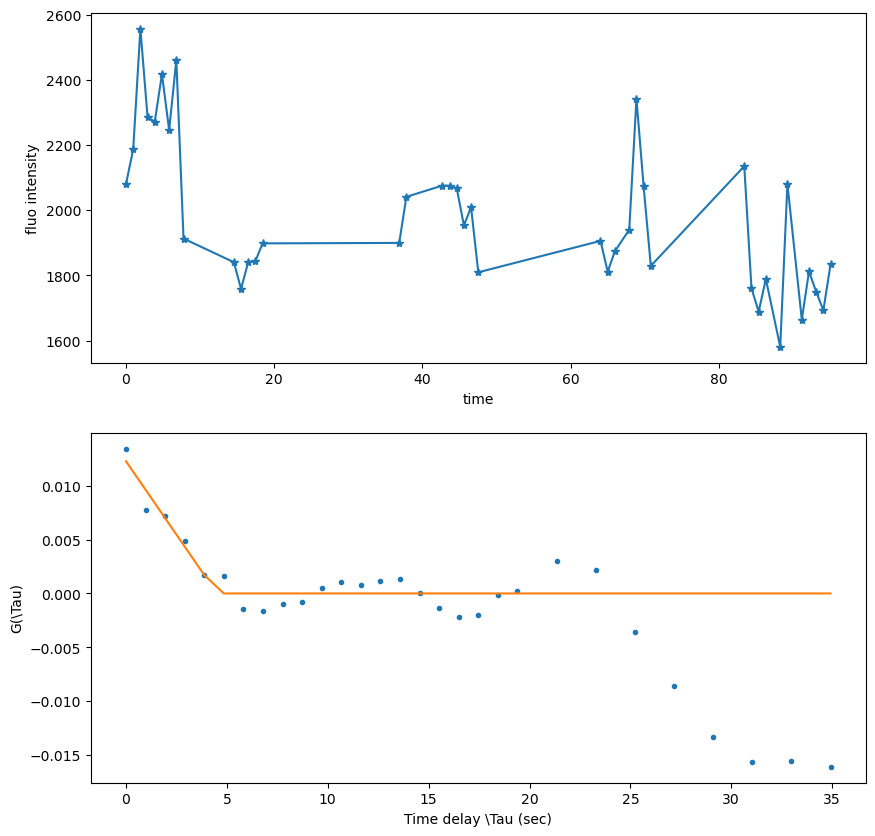

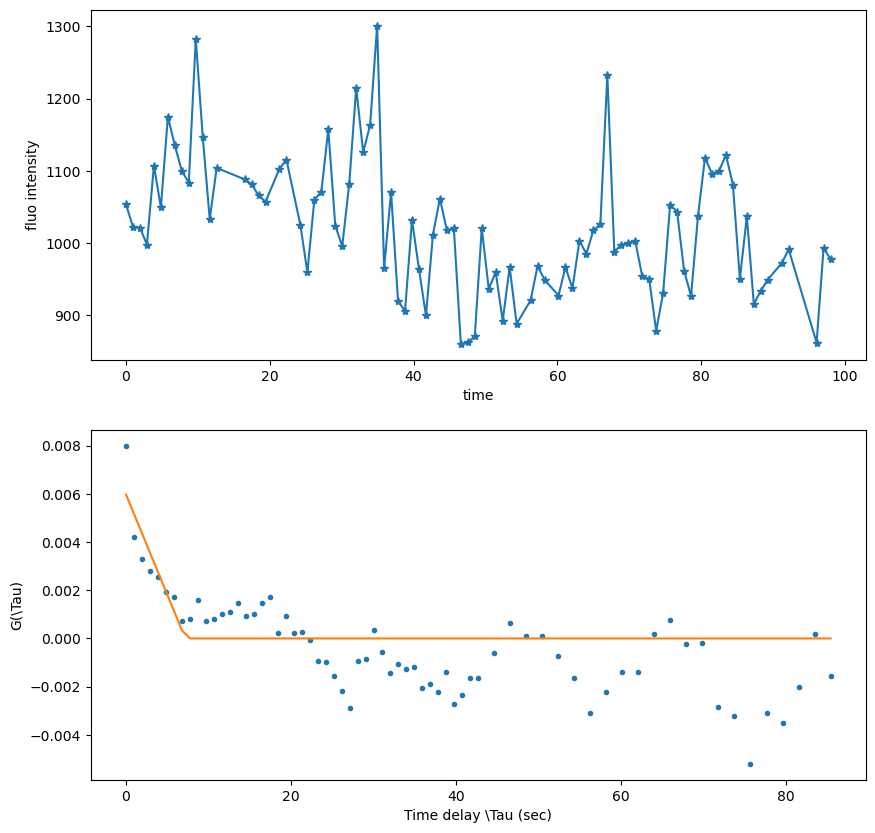

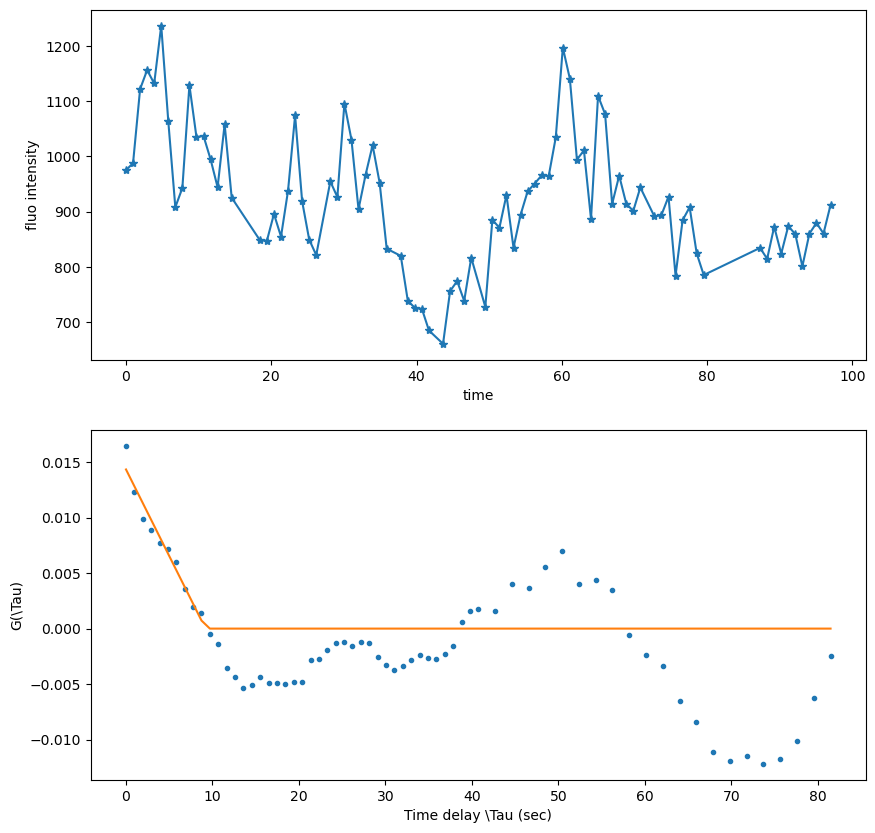

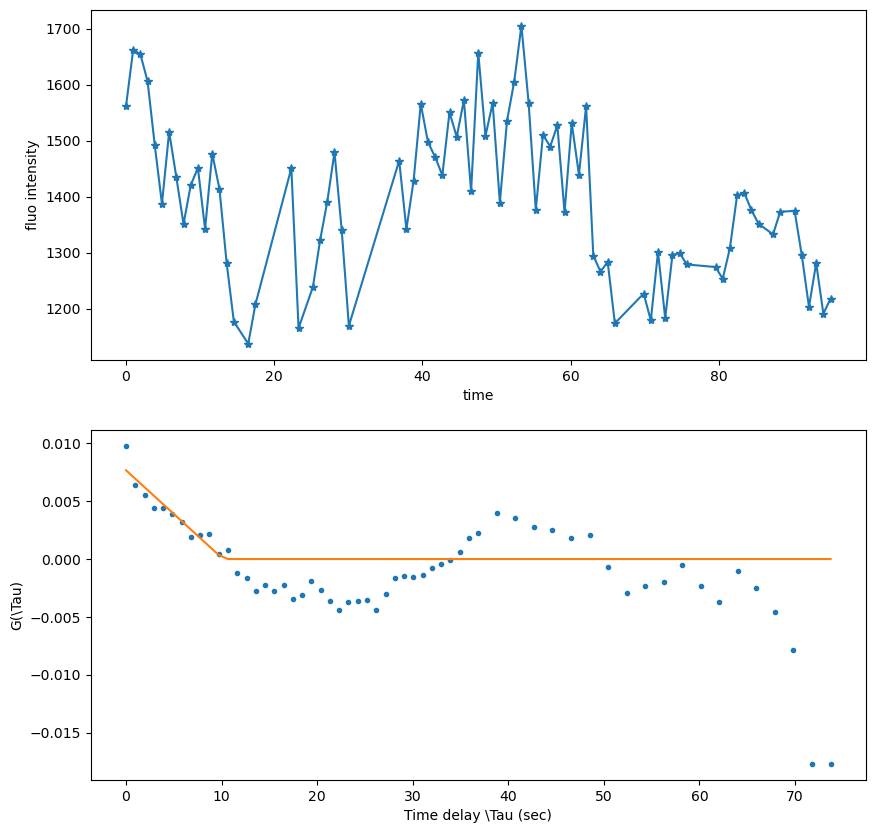

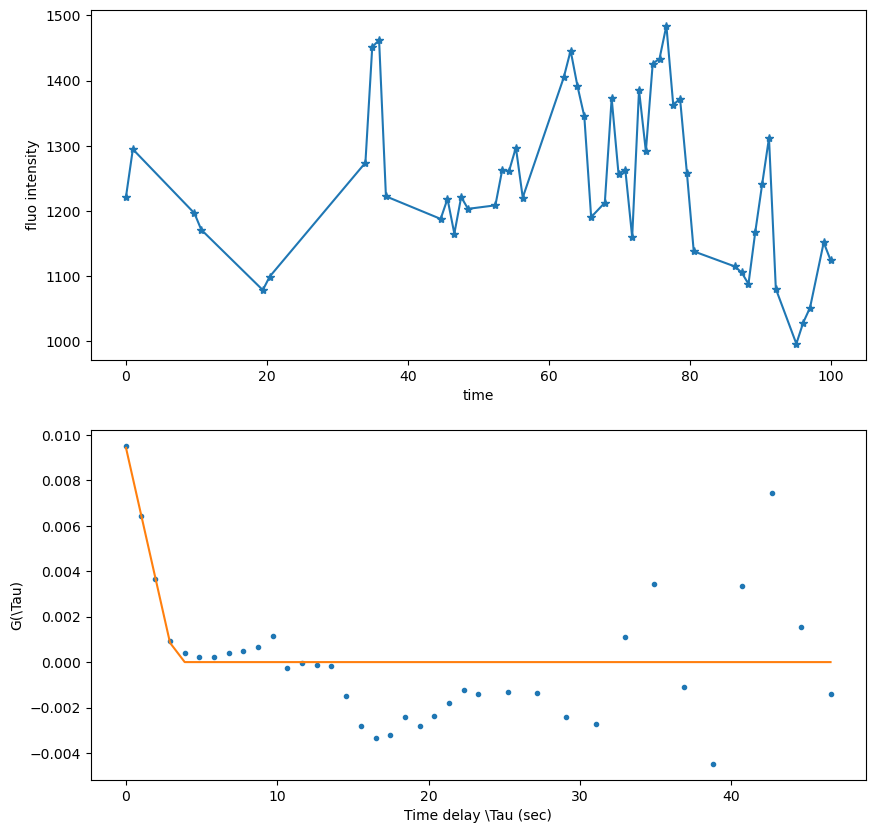

In [207]:
delta_t = DELTA_T
rtol=1e-5
for id_track in np.unique(datas.TRACK_ID):
    (x, 
     y, 
     x_auto, 
     y_auto, 
     elongation_r, 
     translation_init_r,
     perr) = single_track_analysis(datas, 
                                 id_track, 
                                 delta_t = DELTA_T,
                                 protein_size=PROTEIN_SIZE,
                                 normalise_intensity=1,
                                 normalize_auto=True,
                                 mm=None,
                                 lowpass_=False,
                                 cutoff=100,
                                 rtol=1e-5,
                                 method="original",
                                 force_analysis=True,
                                 first_dot=True)
    
    normalise_intensity=1
    x = (datas[datas.TRACK_ID == id_track].sort_values('FRAME')['FRAME'].values -
         min(datas[datas.TRACK_ID == id_track].sort_values('FRAME')['FRAME'].values))*DELTA_T
    y = (datas[datas.TRACK_ID == id_track].sort_values('FRAME')['MEAN_INTENSITY_CH1'].values / normalise_intensity)

    if not check_continuous_time(x, delta_t, rtol=rtol):
        times_diff = np.diff(x)[np.where(np.isclose(np.diff(x), delta_t, rtol=rtol) == False)]
        if (times_diff < 3 * delta_t).all():
            print("to fix")
            i=0
            while i < (len(x)-1):
                if np.round(x[i]-x[i+1], decimals=2)>delta_t:
                    x = x[:i+1] + [(x[i]+x[i+1])/2] + x[i+1:]
                i+=1
        else:
            print("not fix")
            
        
    if x is not np.nan:
        fig, ax = plt.subplots(2,1)
        ax[0].plot(x,y, "*-")
        ax[0].set_xlabel("time")
        ax[0].set_ylabel("fluo intensity")

        ax[1].plot(x_auto, y_auto, '.')
        ax[1].plot(x_auto, fit_function(x_auto, PROTEIN_SIZE/elongation_r, translation_init_r) )
        ax[1].set_xlabel("Time delay \Tau (sec)")
        ax[1].set_ylabel("G(\Tau)")
        fig.set_size_inches((10,10))
        fig.savefig("img/"+str(id_track)+".png")

In [208]:
csv

'/mnt/sda1/Sophie/2-KineticAnalysisData/2-Datas/03-Dropbox/tracking Sna 1sec & 4 sec frame interval/frame interval 1 sec feuille 100x1400 MIP/tracks LLS sinc100x1400,Exp50ms488 30%, 200 frames interval 1sec, 5stack_MIP.csv'

In [209]:
result = pd.DataFrame(columns=["track_id", "mean_x", "mean_intensity", "std_intensity"])
i = 0
for id_track in np.unique(datas.TRACK_ID):
    new_row = {"track_id":id_track,
               "mean_x":datas[datas.TRACK_ID == id_track].sort_values('FRAME')['Y'].mean(),
               "mean_intensity":(datas[datas.TRACK_ID == id_track].sort_values('FRAME')['MEAN_INTENSITY_CH1'].values).mean(),
               "std_intensity":(datas[datas.TRACK_ID == id_track].sort_values('FRAME')['MEAN_INTENSITY_CH1'].values).std()}
    result.loc[i] = new_row
    i+=1
    


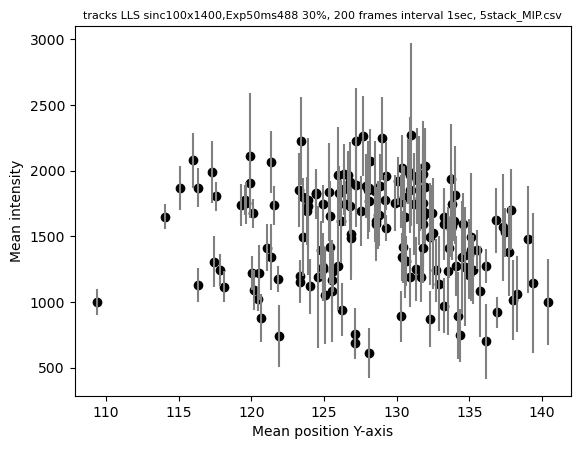

In [210]:
fig, ax = plt.subplots()

ax.scatter(result["mean_x"],result["mean_intensity"], c="black")
ax.errorbar(result["mean_x"],result["mean_intensity"], result["std_intensity"], fmt='none', c="grey", alpha=1)
ax.set_xlabel("Mean position Y-axis")
ax.set_ylabel("Mean intensity")
# ax.set_xlim(15,39)
_ = ax.set_title(csv.split('/')[-1], fontsize=8 )

0.0007

# plot all track that was keep in result table

In [211]:

PROTEIN_SIZE = 1200

In [212]:
columns = ['file_name', 'track_id','len_track', 'elongation_time', 'init_translation_rate', "err_t", "err_c", "MSD"]
result = pd.DataFrame(columns=columns, dtype=float)
elongation_time=[]
translation_rate=[]

DELTA_T = 0.97
list_csv = glob.glob(directory+paths[3]+"/*.csv")
for csv in list_csv:
    if re.search("^(?!.*result).*$", csv,):
        
        datas = read_csv_file_v2(csv, sep=",")
        datas.rename({"TRACK ID":"TRACK_ID",
                     "T":"POSITION_T",
                     "MEAN INTENSITY CH1":"MEAN_INTENSITY_CH1"}, 
                     axis=1, 
                     inplace=True)




        for id_track in np.unique(datas['TRACK_ID']):

            (x, 
             y, 
             x_auto, 
             y_auto, 
             elongation_r, 
             translation_init_r,
             perr) = single_track_analysis(datas, 
                                         id_track, 
                                         delta_t = DELTA_T,
                                         protein_size=PROTEIN_SIZE,
                                         normalise_intensity=1,
                                         normalize_auto=True,
                                         mm=None,
                                         lowpass_=False,
                                         cutoff=100,
                                         rtol=1e-1,
                                         method="original",
                                         force_analysis=True,
                                         first_dot=True)

            MSDs = calculate_MSD(x = datas[datas.TRACK_ID == id_track].sort_values('FRAME')['X'].values,
                                 y = datas[datas.TRACK_ID == id_track].sort_values('FRAME')['Y'].values,
                                 z = datas[datas.TRACK_ID == id_track].sort_values('FRAME')['Z'].values)

            if elongation_r>5:
                d = pd.DataFrame.from_dict({"file_name":"",
                                            'track_id':id_track,
                                            'len_track': len(x),
                                            'elongation_time':elongation_r,
                                            'init_translation_rate':translation_init_r,
                                           "err_t": perr[0], 
                                            "err_c":perr[1],
                                           "MSD":np.sum(MSDs)},
                                           orient='index').T
                result = pd.concat([result, d], ignore_index=True)


        result['tmp'] = 1
        result[["track_id","len_track","elongation_time","init_translation_rate"]].mean()

to fix
original method
to fix
original method
original method
not fix
force analysis
original method
original method
original method
to fix
original method
not fix
force analysis
original method
not fix
force analysis
original method
not fix
force analysis
original method
not fix
force analysis
original method
not fix
force analysis
original method
not fix
force analysis
original method
not fix
force analysis
original method
not fix
force analysis
original method
not fix
force analysis
original method
not fix
force analysis
original method


In [84]:
result.to_csv(csv[:-4]+"_result.csv")
# result[(result["MSD"]<2)].to_csv((files[0][:-4]+"_result_filter_MSD2.csv"))

In [213]:
result.sort_values("track_id")

,file_name,track_id,len_track,elongation_time,init_translation_rate,err_t,err_c,MSD,tmp
0,,0,132,31.726261,2.912166,5.455597,0.412516,0.360352,1
1,,1,167,38.411772,2.249933,4.471701,0.326322,0.395867,1
2,,2,224,15.79499,8.126159,11.118142,1.193287,0.207695,1
3,,3,31,454.098993,274.614284,1.317846,128.231072,0.042969,1
4,,4,222,45.110298,2.413259,4.915633,0.44786,0.510992,1
5,,5,224,733.118076,344.321757,0.483232,95.739934,0.18896,1
6,,6,80,55.292044,10.828158,5.798441,2.917496,0.187319,1
7,,7,27,1043.960522,311.497176,0.427654,138.969241,0.037372,1
8,,8,155,28.544688,2.826929,5.24895,0.354884,0.158035,1
9,,10,160,423.280749,93.117165,0.593431,17.501949,0.278605,1


not fix
force analysis
original method
to fix
original method
to fix
original method
to fix
original method
not fix
force analysis
original method
to fix
original method
to fix
original method
not fix
force analysis
original method
not fix
force analysis
original method
not fix
force analysis
original method
not fix
force analysis
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
not fix
force analysis
original method
to fix
original method
not fix
force analysis
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
not fix
force analysis
original method
to fix
original method
not fix
force analysis
original method
not fix
force analysis
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
not fix
force analysis
original method
to fix
original method
to fix
original method
not fix
force analysis
ori

/home/u2175049/anaconda3/lib/python3.11/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


not fix
force analysis
original method
to fix
original method
to fix
original method
not fix
force analysis
original method
to fix
original method
to fix
original method
not fix
force analysis
original method
not fix
force analysis
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
not fix
force analysis
original method
to fix
original method
to fix
original method
not fix
force analysis
original method
to fix
original method
to fix
original method
not fix
force analysis
original method
not fix
force analysis
original method
not fix
force analysis
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
not fix
force analysis
original method
to fix
original method
not fix
forc

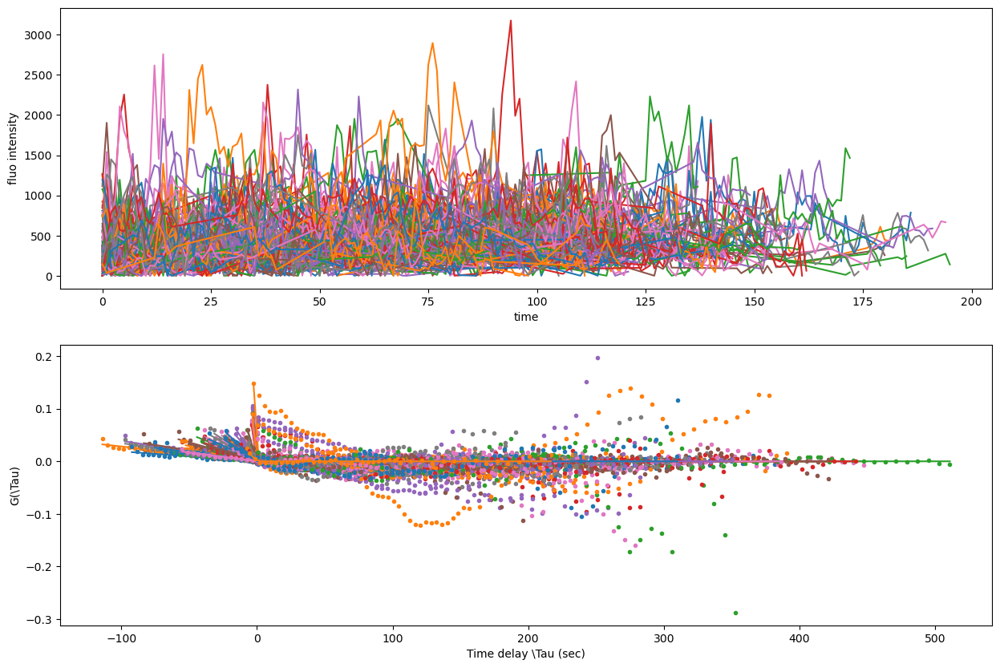

In [66]:
import matplotlib.colors as mcolors
fig, ax = plt.subplots(2,1)

colors = list(mcolors.TABLEAU_COLORS.keys())

i=0
for id_track in np.unique(result['track_id']):#[:5]:
# for id_track in [10,710,3021,7,16,8010,5471]:
# for id_track in [9353,19,5756,2881,11,6592,2092,1512,1754,6495,3108,1129,6350]:

    x = datas[datas.TRACK_ID==id_track].sort_values('FRAME')['POSITION_T'].values-min(datas[datas.TRACK_ID==id_track].sort_values('FRAME')['POSITION_T'].values)
    y = datas[datas.TRACK_ID==id_track].sort_values('FRAME')['MEAN_INTENSITY_CH1'].values-np.min(datas[datas.TRACK_ID==id_track].sort_values('FRAME')['MEAN_INTENSITY_CH1'].values)
    
    if len(x)>50:
        ax[0].plot(x, y, color=colors[i])


        (x, 
         y, 
         x_auto, 
         y_auto, 
         elongation_r, 
         translation_init_r,
         perr) = single_track_analysis(datas, 
                                     id_track, 
                                     delta_t = DELTA_T,
                                     protein_size=PROTEIN_SIZE,
                                     normalise_intensity=1,
                                     normalize_auto=True,
                                     mm=None,
                                     lowpass_=False,
                                     cutoff=100,
                                     rtol=1e-5,
                                     method="original",
                                     force_analysis=True,
                                     first_dot=True)


        ax[1].plot(x_auto-PROTEIN_SIZE/elongation_r, 
                   y_auto, 
                   '.', 
                   color=colors[i])
        ax[1].plot(x_auto-PROTEIN_SIZE/elongation_r, 
                   fit_function(x_auto, PROTEIN_SIZE/elongation_r, translation_init_r ), 
                   color=colors[i] )



        if i == 7:
            i=0
        else:
            i+=1

ax[0].set_xlabel("time")
ax[0].set_ylabel("fluo intensity")
ax[1].set_xlabel("Time delay \Tau (sec)")
ax[1].set_ylabel("G(\Tau)")
# ax[1].set_ylim(-0.002, 0.002)


fig.set_size_inches((15,10))
# print(len(np.unique(result['track_id'])))

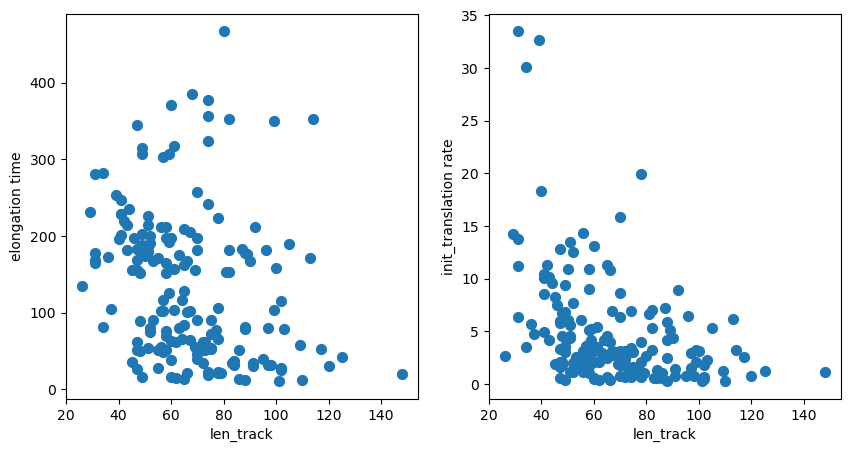

In [67]:
fig, ax = plt.subplots(1, 2)
ax[0].scatter(result['len_track'], result['elongation_time'], s=50)
ax[1].scatter(result['len_track'], result['init_translation_rate'], s=50)
ax[0].set_xlabel('len_track')
ax[0].set_ylabel('elongation time')

ax[1].set_xlabel('len_track')
ax[1].set_ylabel('init_translation rate')
fig.set_size_inches((10,5))

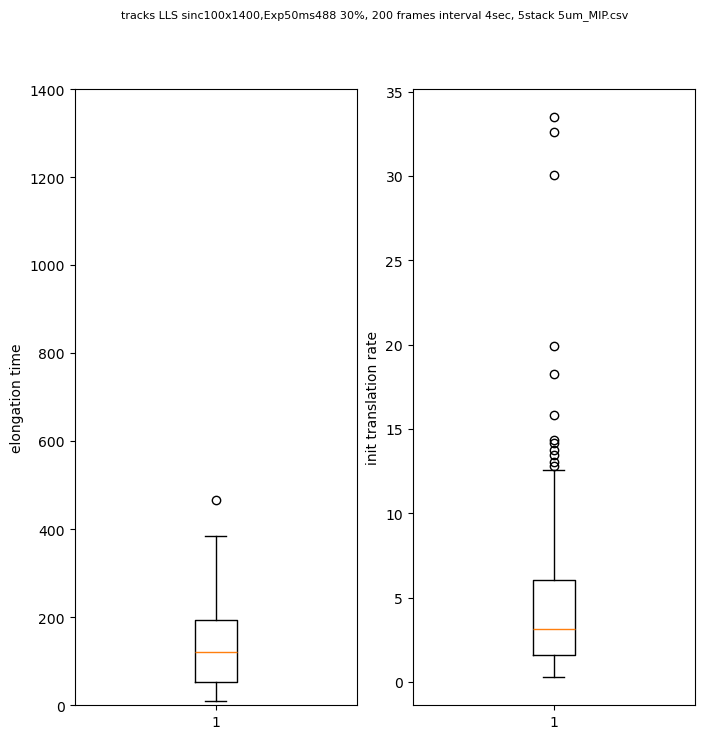

In [68]:
fig, ax = plt.subplots(1, 2)
ax[0].boxplot(result['elongation_time'].to_numpy())
ax[1].boxplot(result['init_translation_rate'].to_numpy())
ax[0].set_ylabel('elongation time')
ax[1].set_ylabel('init translation rate')
fig.set_size_inches((8,8))
ax[0].set_ylim(0,1400)

_ = fig.suptitle(files[0], fontsize=8 )

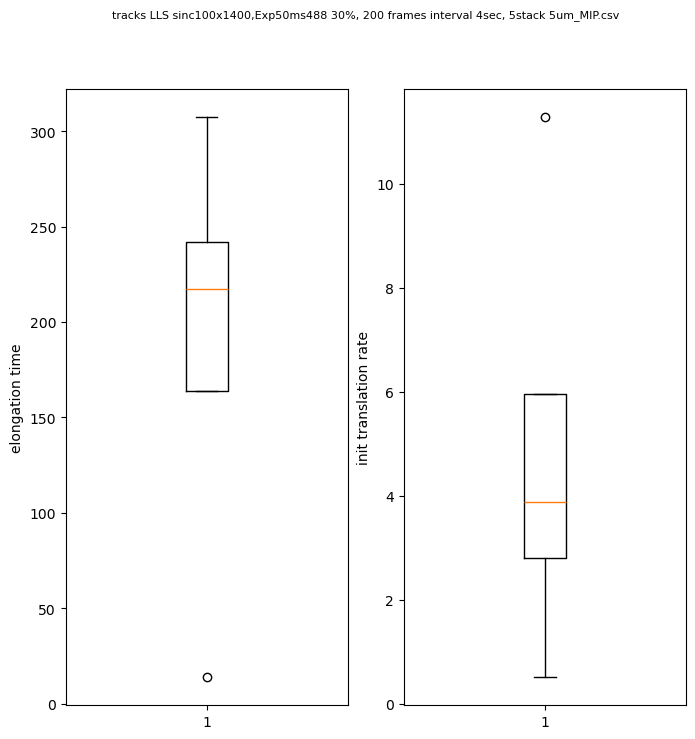

In [69]:

fig, ax = plt.subplots(1, 2)
ax[0].boxplot(result[(result["MSD"]<2) ]['elongation_time'].to_numpy())
ax[1].boxplot(result[(result["MSD"]<2)]['init_translation_rate'].to_numpy())
ax[0].set_ylabel('elongation time')
ax[1].set_ylabel('init translation rate')
fig.set_size_inches((8,8))
# ax[0].set_ylim(0,1400)

_ = fig.suptitle(files[0], fontsize=8 )

# Multiple file analysis

In [25]:
DELTA_T = 0.02174573
PROTEIN_SIZE = 1200

In [27]:
columns = ['file_name', 'track_id','len_track', 'elongation_time', 'init_translation_rate', "err_c", "err_t"]
result = pd.DataFrame(columns=columns, dtype=float)
elongation_time=[]
translation_rate=[]
for f in files:
    f = path+f
    datas = read_csv_file(f)


    for id_track in np.unique(datas['TRACK_ID']): 
        (x, 
         y, 
         x_auto, 
         y_auto, 
         elongation_r, 
         translation_init_r,
         perr) = single_track_analysis(datas, 
                                                     id_track, 
                                                     delta_t = DELTA_T,
                                                     protein_size=PROTEIN_SIZE,
                                                     normalise_intensity=1,
                                                     normalize_auto=True,
                                                     mm=None,
                                                     lowpass_=False,
                                                     cutoff=100,
                                                     rtol=1e-5,
                                                     method="original",
                                                    force_analysis=False)

        
        if elongation_r>5:
            d = pd.DataFrame.from_dict({'file_name':f.split('/')[-1],
                                        'track_id':id_track,
                                        'len_track': len(x),
                                        'elongation_time':elongation_r,
                                        'init_translation_rate':translation_init_r,
                                        'init_translation_rate':translation_init_r,
                                   "err_t": perr[0], 
                                    "err_c":perr[1]},
                                       orient='index').T
            result = pd.concat([result, d], ignore_index=True)



result['tmp'] = 1
# result.drop(result[result["len_track"]<100].index, inplace=True)

to fix
original method
original method
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
original method
to fix
original method
to fix
original method
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method
to fix
original method


In [28]:
# result.sort_values('len_track')
result

,file_name,track_id,len_track,elongation_time,init_translation_rate,err_c,err_t,tmp
0,DUP_Sun_100x1400_30-488_20msec_AFAP_190_track.csv,7,205,1317.24221,1563.382287,383.676136,0.226613,1
1,DUP_Sun_100x1400_30-488_20msec_AFAP_190_track.csv,10,267,633.313319,136.234798,15.446009,0.213499,1
2,DUP_Sun_100x1400_30-488_20msec_AFAP_190_track.csv,11,118,2352.270614,1851.102152,930.985647,0.255902,1
3,DUP_Sun_100x1400_30-488_20msec_AFAP_190_track.csv,16,192,1633.536754,1301.189145,262.813027,0.15015,1
4,DUP_Sun_100x1400_30-488_20msec_AFAP_190_track.csv,19,149,2851.235216,5895.043257,2240.281541,0.158268,1
...,...,...,...,...,...,...,...,...
145,DUP_Sun_100x1400_30-488_20msec_AFAP_190_t9_tra...,8351,117,2040.674423,1452.476147,236.143092,0.09331,1
146,DUP_Sun_100x1400_30-488_20msec_AFAP_190_t9_tra...,8388,113,1003.350812,2437.363685,1177.003736,0.585206,1
147,DUP_Sun_100x1400_30-488_20msec_AFAP_190_t9_tra...,9193,116,8438.89104,2994.762593,1116.157323,0.053371,1
148,DUP_Sun_100x1400_30-488_20msec_AFAP_190_t9_tra...,9746,112,7209.024606,9351.532459,1396.917395,0.025486,1


In [29]:
result.to_csv("/mnt/sda1/Sophie/2-KineticAnalysisData/2-Datas/02-Pierre/analysis.csv")

track_id                  4032.125000
len_track                  150.625000
elongation_time          19482.804586
init_translation_rate    58660.438013
tmp                          1.000000
dtype: float64


/tmp/ipykernel_366698/2862878632.py:7: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  print(result.mean())


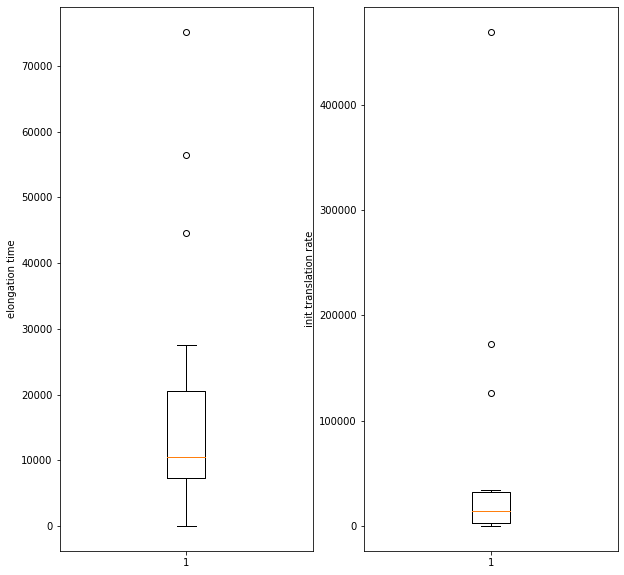

In [195]:
fig, ax = plt.subplots(1, 2)
ax[0].boxplot(result['elongation_time'])
ax[1].boxplot(result['init_translation_rate'])
ax[0].set_ylabel('elongation time')
ax[1].set_ylabel('init translation rate')
fig.set_size_inches((10,10))
print(result.mean())

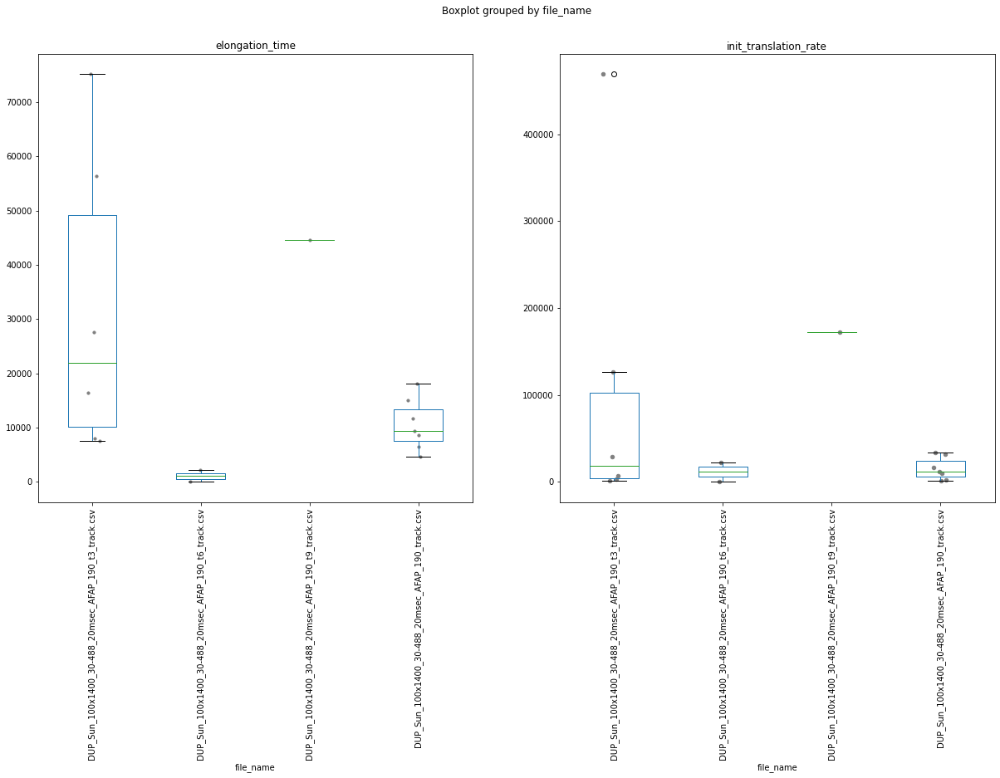

In [196]:
# result['elongation_time'] = pd.to_numeric(result['elongation_time'])
fig, ax = plt.subplots(1,2)
result.boxplot(['elongation_time'] , 
               by='file_name', 
               grid=False, 
               ax = ax[0],
               rot=90, 
              )

result.boxplot([ 'init_translation_rate'] , 
               by='file_name', 
               grid=False, 
               ax = ax[1],
               rot=90
               )

group = 'file_name'
column = 'elongation_time'
grouped = result.groupby(group)
names, vals, xs = [], [] ,[]
for i, (name, subdf) in enumerate(grouped):
    names.append(name)
    vals.append(subdf[column].tolist())
    xs.append(np.random.normal(i+1, 0.04, subdf.shape[0]))
clevels = np.linspace(0., 1., len(grouped))
for x, val, clevel in zip(xs, vals, clevels):
    ax[0].scatter(x, val, c='grey', alpha=1, s=10)
    
    
group = 'file_name'
column = 'init_translation_rate'
grouped = result.groupby(group)
names, vals, xs = [], [] ,[]
for i, (name, subdf) in enumerate(grouped):
    names.append(name)
    vals.append(subdf[column].tolist())
    xs.append(np.random.normal(i+1, 0.04, subdf.shape[0]))
clevels = np.linspace(0., 1., len(grouped))
for x, val, clevel in zip(xs, vals, clevels):
    ax[1].scatter(x, val, c='grey', alpha=1, s=20)
    
# ax[1].set_ylim(0,250)
fig.set_size_inches((20,10))

In [197]:
result.groupby(by='file_name')[['len_track','elongation_time', 'init_translation_rate']].mean()

,len_track,elongation_time,init_translation_rate
file_name,,,
DUP_Sun_100x1400_30-488_20msec_AFAP_190_t3_track.csv,122.666667,31851.439123,105996.340208
DUP_Sun_100x1400_30-488_20msec_AFAP_190_t6_track.csv,114.500000,1067.004762,11317.624959
DUP_Sun_100x1400_30-488_20msec_AFAP_190_t9_track.csv,109.000000,44568.529603,172373.790806
DUP_Sun_100x1400_30-488_20msec_AFAP_190_track.csv,190.857143,10559.099929,15368.560890


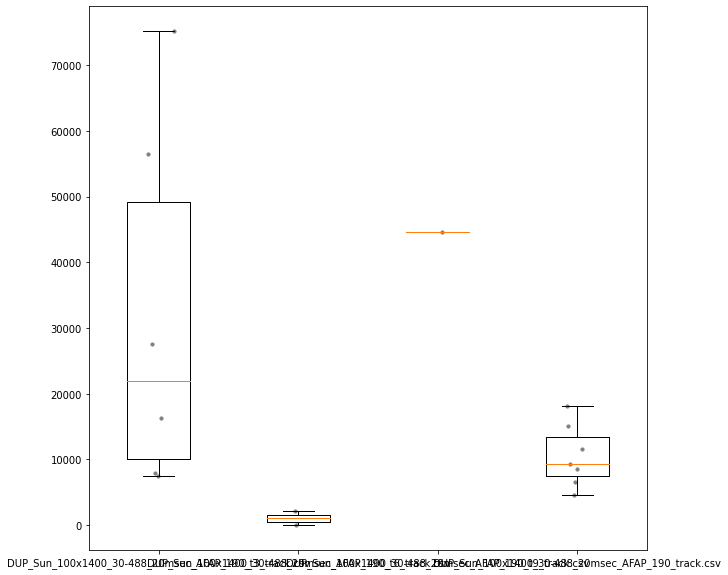

In [198]:
from matplotlib import cm
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# initialize dataframe
# n = 200
# ngroup = 3
# df = pd.DataFrame({'data': np.random.rand(n), 'group': map(np.floor, np.random.rand(n) * ngroup)})
fig, ax = plt.subplots()

group = 'file_name'
column = 'elongation_time'
grouped = result.groupby(group)

names, vals, xs = [], [] ,[]

for i, (name, subdf) in enumerate(grouped):
    names.append(name)
    vals.append(subdf[column].tolist())
    xs.append(np.random.normal(i+1, 0.04, subdf.shape[0]))

ax.boxplot(vals, labels=names, )
ngroup = len(vals)



for x, val, clevel in zip(xs, vals, clevels):
    ax.scatter(x, val, c='grey', alpha=1, s=10)
    
ax.grid(False)
fig.set_size_inches((10,10))

In [199]:
result[["file_name", 'len_track','elongation_time', 'init_translation_rate']]

,file_name,len_track,elongation_time,init_translation_rate
0,DUP_Sun_100x1400_30-488_20msec_AFAP_190_track.csv,205,9318.07351,11914.330514
1,DUP_Sun_100x1400_30-488_20msec_AFAP_190_track.csv,267,4580.418322,989.748806
2,DUP_Sun_100x1400_30-488_20msec_AFAP_190_track.csv,192,11648.633438,9614.170446
3,DUP_Sun_100x1400_30-488_20msec_AFAP_190_track.csv,201,6529.842023,2621.069846
4,DUP_Sun_100x1400_30-488_20msec_AFAP_190_track.csv,150,8592.012892,16662.326354
5,DUP_Sun_100x1400_30-488_20msec_AFAP_190_track.csv,161,18147.536132,31855.077786
6,DUP_Sun_100x1400_30-488_20msec_AFAP_190_track.csv,160,15097.183184,33923.202475
7,DUP_Sun_100x1400_30-488_20msec_AFAP_190_t3_tra...,122,27602.012523,7137.752191
8,DUP_Sun_100x1400_30-488_20msec_AFAP_190_t3_tra...,164,7521.844156,726.496959
9,DUP_Sun_100x1400_30-488_20msec_AFAP_190_t3_tra...,159,8002.205743,3564.989263


In [200]:
result[["file_name", 'len_track','elongation_time', 'init_translation_rate']].mean()

/tmp/ipykernel_366698/1952775797.py:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  result[["file_name", 'len_track','elongation_time', 'init_translation_rate']].mean()


len_track                  150.625000
elongation_time          19482.804586
init_translation_rate    58660.438013
dtype: float64

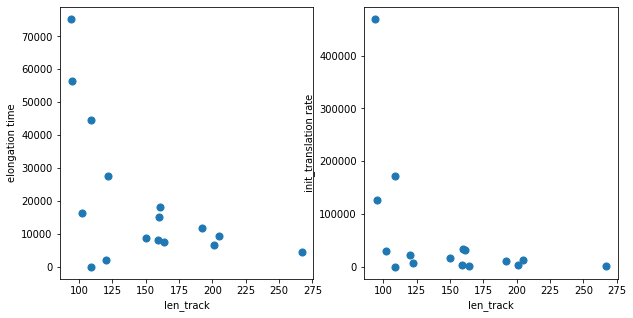

In [201]:
fig, ax = plt.subplots(1, 2)
ax[0].scatter(result['len_track'], result['elongation_time'], s=50)
ax[1].scatter(result['len_track'], result['init_translation_rate'], s=50)
ax[0].set_xlabel('len_track')
ax[0].set_ylabel('elongation time')

ax[1].set_xlabel('len_track')
ax[1].set_ylabel('init_translation rate')
fig.set_size_inches((10,5))

In [202]:
result["len_track"]*DELTA_T

0     0.615
1     0.801
2     0.576
3     0.603
4      0.45
5     0.483
6      0.48
7     0.366
8     0.492
9     0.477
10    0.285
11    0.282
12    0.306
13    0.327
14     0.36
15    0.327
Name: len_track, dtype: object